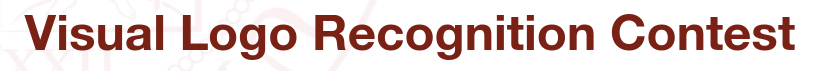

VISION AND COGNITIVE SYSTEMS A.Y. 2025/2026

The aim of the contest is to retrieve the most similar images representing logos of famous companies from a database set containing 110 images. We will consider 4 query images and use the SIFT algorithm. Model performance will be evaluated using average precision (AP) and mean average precision (mAP) metrics.
You can modify the baseline (parameters, feature matching technique, ...) and then submit your results.

# 0. Data Loading

In [2]:
%%capture
# Update OpenCV package
!pip install -U opencv-python
!pip install opencv-contrib-python


In [ ]:
# Upload the zip folders (query.zip and database.zip)
#%%capture
#!unzip query.zip
#!unzip database.zip

In [23]:
import os, cv2, numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# config
QUERY_DIR='queries/query'; DB_DIR='database'
img_size=(400,400)
variant_names=['inverted','128x128','256x256','400x400','1024x1024','2048x2048','gray','histeq','sharpen','blur']

# helpers
def safe_imread(p):
    img=cv2.imread(p)
    if img is None: raise IOError(p)
    return img

def make_variants_from_img(img):
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    g=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kernel=np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
    return {
        'inverted': cv2.bitwise_not(img),
        '128x128': cv2.resize(img,(128,128),interpolation=cv2.INTER_LINEAR),
        '256x256': cv2.resize(img,(256,256),interpolation=cv2.INTER_LINEAR),
        '400x400': cv2.resize(img,(400,400),interpolation=cv2.INTER_LINEAR),
        '1024x1024': cv2.resize(img,(1024,1024),interpolation=cv2.INTER_LINEAR),
        '2048x2048': cv2.resize(img,(2048,2048),interpolation=cv2.INTER_LINEAR),
        'gray': g,
        'histeq': cv2.equalizeHist(g),
        'sharpen': cv2.filter2D(img,-1,kernel),
        'blur': cv2.GaussianBlur(img,(5,5),0)
    }

# load
query_files=sorted(os.listdir(QUERY_DIR))
queries=[(f,cv2.resize(safe_imread(os.path.join(QUERY_DIR,f)),img_size)) for f in query_files]
db_files=sorted(os.listdir(DB_DIR),key=lambda x:int(os.path.splitext(x)[0]))
dbs=[(f,cv2.resize(safe_imread(os.path.join(DB_DIR,f)),img_size)) for f in db_files]

# build variant arrays
q_variants={v:[] for v in variant_names}
db_variants={v:[] for v in variant_names}
for _,img in queries:
    vs=make_variants_from_img(img)
    for v in variant_names: q_variants[v].append(vs[v])
for _,img in dbs:
    vs=make_variants_from_img(img)
    for v in variant_names: db_variants[v].append(vs[v])

# summary sanity check
print("Variants:",variant_names)
print("Queries:",len(queries),"DB:",len(dbs))
print("Size of DB (All its variants): ", len(db_variants))
for variant in variant_names:
    print(f"The size of variant {variant} is {len(db_variants[variant])} ")

Variants: ['inverted', '128x128', '256x256', '400x400', '1024x1024', '2048x2048', 'gray', 'histeq', 'sharpen', 'blur']
Queries: 4 DB: 110
Size of DB (All its variants):  10
The size of variant inverted is 110 
The size of variant 128x128 is 110 
The size of variant 256x256 is 110 
The size of variant 400x400 is 110 
The size of variant 1024x1024 is 110 
The size of variant 2048x2048 is 110 
The size of variant gray is 110 
The size of variant histeq is 110 
The size of variant sharpen is 110 
The size of variant blur is 110 


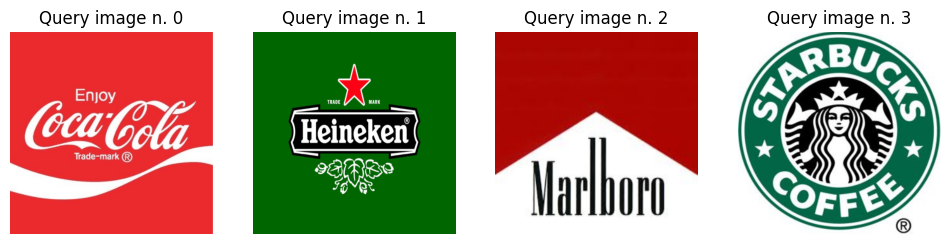

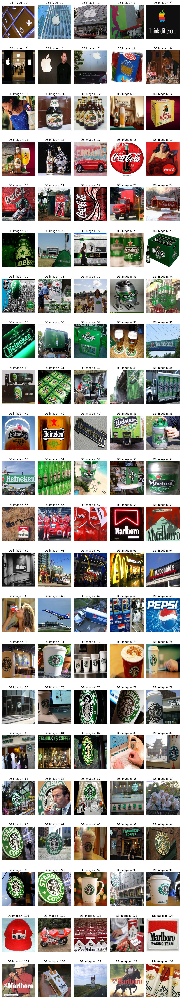

In [24]:
# Plot query images (robust: handles list of images or list of (name,img) tuples)
fig = plt.figure(figsize=(12, 6))
Q = [q[1] if isinstance(q, (list,tuple)) else q for q in queries]
for i, img in enumerate(Q):
    ax = plt.subplot(1, len(Q), i+1)
    ax.set_title(f"Query image n. {i}")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.show()

# Plot database images (robust)
DB = [d[1] if isinstance(d, (list,tuple)) else d for d in dbs]
ncols = 5
nrows = max(1, (len(DB) + ncols - 1) // ncols)
fig = plt.figure(figsize=(12, nrows*3))
for i, img in enumerate(DB):
    ax = plt.subplot(nrows, ncols, i+1)
    ax.set_title(f"DB image n. {i}")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.tight_layout(); plt.show()

In [25]:
# Ground-truth arrays per logo (assumes DB length from whichever DB var exists)
N_DB = len(DB)
coca_cola_GT = np.zeros(N_DB)
marlboro_GT   = np.zeros(N_DB)
starbucks_GT  = np.zeros(N_DB)
heineken_GT   = np.zeros(N_DB)

# GT ranges (These ranges are invariant to the transformations applied in "VARIANTS")
coca_cola_GT[18:25] = 1
marlboro_GT[55:61] = 1
marlboro_GT[100:]  = 1
starbucks_GT[70:100] = 1
heineken_GT[25:55] = 1

GT_matrix = np.vstack([coca_cola_GT, heineken_GT, marlboro_GT, starbucks_GT])
print(f"GT matrix shape: {GT_matrix.shape}")

n_coca_cola = int(coca_cola_GT.sum())
n_heineken  = int(heineken_GT.sum())
n_marlboro  = int(marlboro_GT.sum())
n_starbucks = int(starbucks_GT.sum())
n_others = N_DB - (n_coca_cola + n_heineken + n_marlboro + n_starbucks)

print(f"Number of database images (coca_cola): {n_coca_cola}")
print(f"Number of database images (heineken):   {n_heineken}")
print(f"Number of database images (marlboro):   {n_marlboro}")
print(f"Number of database images (starbucks):  {n_starbucks}")
print(f"Number of database images (others):     {n_others}")

GT matrix shape: (4, 110)
Number of database images (coca_cola): 7
Number of database images (heineken):   30
Number of database images (marlboro):   16
Number of database images (starbucks):  30
Number of database images (others):     27


# 1. Modelling (Hyperparams) & Inference

Lets define here the basic hyperparameter exploration space for this optimization problem based on SIFT.

In [26]:
ALGORITHM = "SIFT"

############################## SIFT HYPERPARAMETERS

# Max number of best features to retain (0 is unlimited)
N_FEATURES = 0 

# Number of Octaves (Scaling Layers), sometimes its automatically by image resolution
N_OCTAVES = 3

## THRESHOLDS (THEY WORK DIFFERENTLY)
# Filter edge-like features (The larger the less features FILTERED OUT )
EDGE_THRESHOLD = 10
# Filter out weak features in low contrast regions (The larger, the less features PRODUCED)
CONTRAST_THRESHOLD = 0.04

# SIGMA of Gaussian at octave #0 (For weak images put more!)
SIGMA = 1.6

# Wheter to Precisly Upscale in the scale pyramid (x -> 2x), preventing localization bias
ENABLE_PRECISE_UPSCALE = True


############################## FILTERING/PROCESSING HYPERPARAMETERS
LOWE_RATIO = 0.66



In [ ]:
### COMPUTE SIFT FOR K=10 TRANSFORMATIONS (114 * 10 = 1140 images) 
### FOR NOW THIS VERSION USES THE SAME HYPERPARAMETERS (DEFAULT SIFT) FOR ALL EXECUTIONS
sift_by_variant = {
    v: cv2.SIFT_create(
        nfeatures=N_FEATURES,
        nOctaveLayers=N_OCTAVES,
        edgeThreshold=EDGE_THRESHOLD,
        contrastThreshold=CONTRAST_THRESHOLD,
        sigma=SIGMA,
        enable_precise_upscale=ENABLE_PRECISE_UPSCALE
    ) 
    for v in variant_names
}

# Execute xK (10) transformations to get the descriptors and keypoints of each image in each K variant

q_kps = {v: [] for v in variant_names}
q_desc = {v: [] for v in variant_names}
db_kps = {v: [] for v in variant_names}
db_desc = {v: [] for v in variant_names}

for v in variant_names:
    sift = sift_by_variant[v]
    for img in q_variants[v]:
        kp, des = sift.detectAndCompute(img, None)
        q_kps[v].append(kp)
        q_desc[v].append(des)
    for img in db_variants[v]:
        kp, des = sift.detectAndCompute(img, None)
        db_kps[v].append(kp)
        db_desc[v].append(des)

KeyboardInterrupt: 

Ratio test

In [ ]:
# NOW APPLY MATCHING OF KEYPOINTS USING DESCRITORS SIMILARITY (BRUTE FORCE) GET A SCORE PER SIFT?
# We got 10xQuery images and 10xDatabase images we should not cross them all but rather

# Brute-force matcher
bf = cv2.BFMatcher_create(cv2.NORM_L2)

# Matrix containing the number of matches per logo
num_matches = np.zeros((len(query_images), len(db_images)))

# Filter matches using the Lowe's ratio test
ratio_thresh = LOWE_RATIO

# Save  matches for each descriptor of query images
logo_matches = [] # List of lists

# For each query image
for q in range(len(query_images)):
  q_matches = []
  # For each database image
  for db in range(len(db_images)):
    matches = bf.knnMatch(query_des[q], db_des[db], k=2)
    # Apply ratio test
    n_matches = 0
    sel_matches = []
    for m,n in matches:
      if m.distance < ratio_thresh * n.distance:
        n_matches += 1
        sel_matches.append(m)
    # Save number of matches
    num_matches[q, db] = n_matches
    # Save matches
    q_matches.append(sel_matches)
  logo_matches.append(q_matches)

for idx, logo in enumerate(logo_names):
  print("Number of matches (" + logo + "):")
  print(num_matches[idx])

Number of matches (Cocacola):
[ 3.  1.  2.  0.  5.  2.  2.  5.  6.  0.  3.  0.  0.  0.  1.  0.  0.  0.
 29. 25. 10.  1.  4.  3.  2.  2.  1.  2.  3.  1.  0.  0.  2.  3.  2.  1.
  1.  3.  1.  3.  0.  2.  1.  1.  2.  1.  1.  2.  2.  3.  3.  1.  3.  0.
  1.  4.  1.  1.  0.  1.  3.  0.  1.  1.  2.  0.  1.  0.  3.  0.  1.  2.
  0.  0.  1.  1.  1.  3.  1.  1.  1.  1.  0.  3.  1.  1.  1.  5.  0.  0.
  2.  1.  2.  0.  2.  0.  2.  5.  1.  1.  2.  3.  5.  0.  0.  3.  2.  4.
  3.  1.]
Number of matches (Heineken):
[  1.   0.   0.   0.   5.   1.   3.   3.   1.   0.   0.   0.   1.   2.
   0.   1.   0.   2.   0.   0.   0.   0.   0.   2.   3.  31.  14.   1.
 114.  27.   4.  22.   0.  15.   1.  24.   1.  37.   4.  11.   7.  16.
   6.   0.   2.  59.  31.   3.  42.  17.  65.   1.  10.  42.  17.   0.
   6.   3.   5.   2.   2.   0.   0.   0.   1.   1.   0.   0.   2.   3.
   5.   0.   1.   0.   1.   0.   1.   0.   1.   2.   0.   0.   1.   0.
   1.   1.   1.   0.   0.   1.   1.   1.   0.   2.   0.   1.   0. 

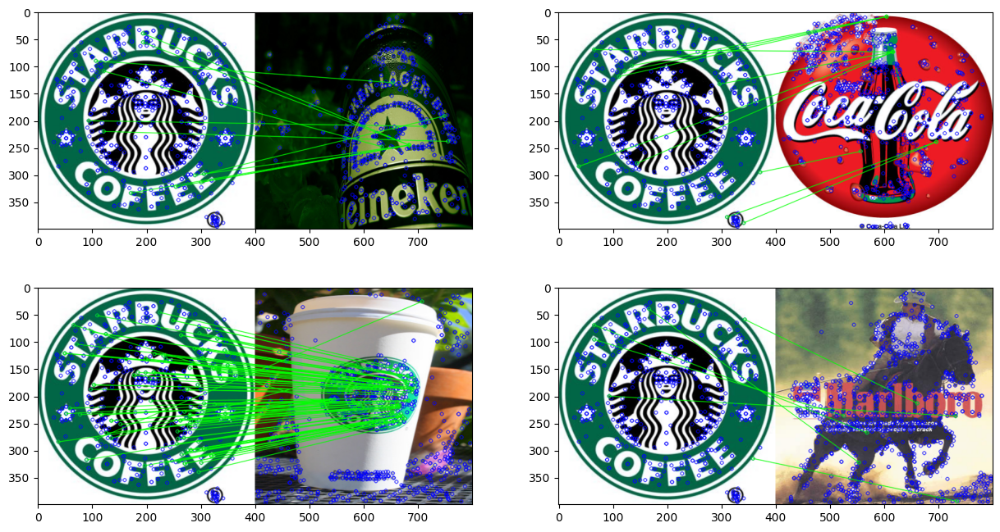

In [13]:
# Draw some matches
_  = plt.figure(figsize=(15, 8))
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
plt_list = [25, 18, 71, 108]
for idx, n in enumerate(plt_list):
  img_matches = cv2.drawMatches(query_images[3], query_kps[3], db_images[n], db_kps[n], logo_matches[3][n], None, **draw_params)
  _ = plt.subplot(2, 2, idx+1), plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))

# 2. Performance Evaluation

The performance of the model will be evaluated in terms of precision, recall and average precision.

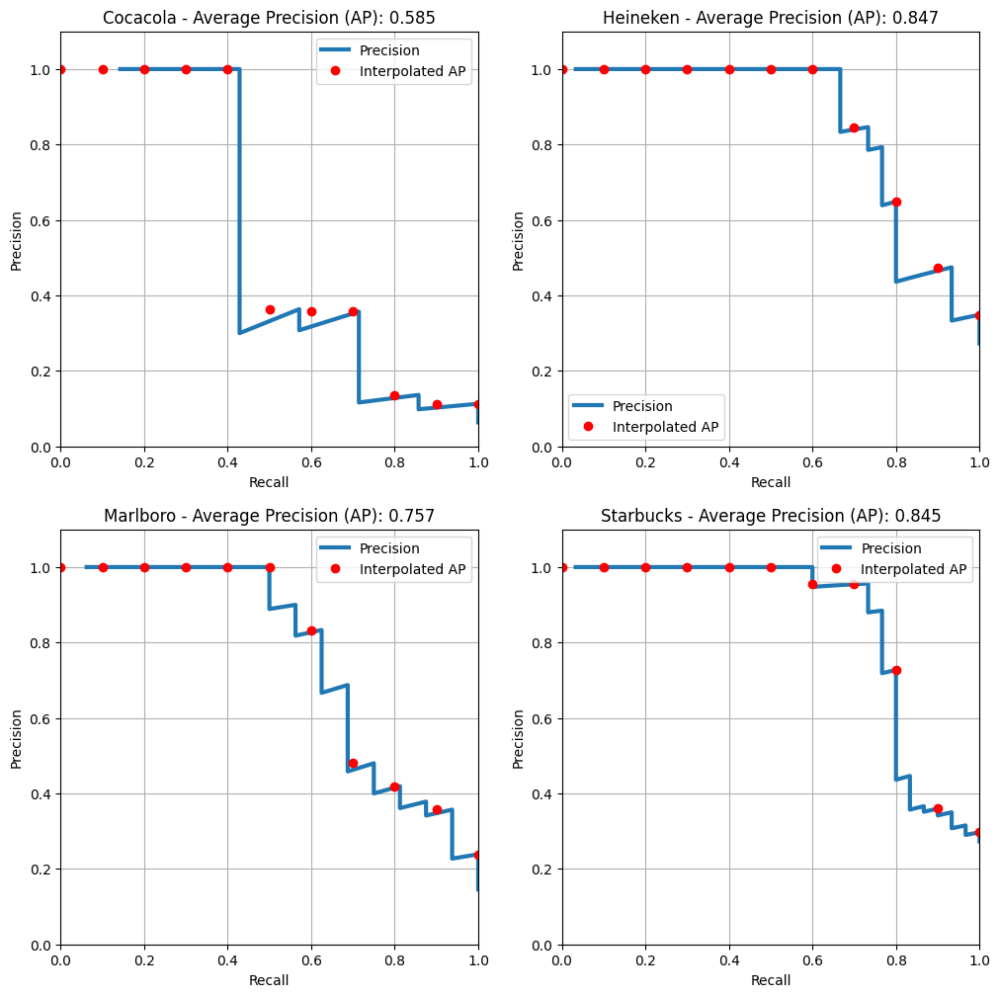

In [15]:
# Average precision for each logo
AP_all = np.zeros(len(query_images))

_ = plt.figure(figsize=(12, 12))
for i in range(len(query_images)):
  # Rank images in descending order according to the number of detected matches
  # The idx (corresponding to database images) which have the largest number of valid matches will be situated towards the start of the array
  # The idx containing the least number of valid matches will be situated towards the end of the array
  # In this manner, we arrange predictions based on its validity or confidence (here, measured by the number of matches)
  idx = np.argsort(-num_matches[i])

  # True Positives
  TP = GT_matrix[i, idx] == 1

  # False Positives
  FP = GT_matrix[i, idx] == 0

  # TP and FP for each k
  # Note that as we go from the start to the end of the array, we are effectively varying the confidence threshold (here, we use the number of matches as our confidence measure).
  # This is possible since the idx is sorted, and correspondingly, so are the TP and FP arrays
  TP = np.cumsum(TP)
  FP = np.cumsum(FP)

  # Precision/Recall for each k
  prec = TP / (TP + FP)
  rec = TP / np.sum(GT_matrix[i])

  # (Interpolated) Average precision (as in Pascal VOC2008)
  AP = 0
  interp_prec = []
  # We evaluate the precision at 11 recall values to reduce ''wiggles'' in the precision/recall curve
  for t in np.linspace(0, 1, num=11):
    p = prec[rec >= t]
    if p.size == 0:
      p = 0
    else:
      p = p.max()
    interp_prec.append(p)
    AP = AP + p/11
  AP_all[i] = AP

  # Plot precision/recall
  _ = plt.subplot(2, 2, i+1)
  plt.title(f"{logo_names[i]} - Average Precision (AP): {AP:.3f}")
  _ = plt.plot(rec, prec, '-', linewidth=3)
  _ = plt.plot(np.linspace(0, 1, num=11), interp_prec, 'o', color='red', linewidth=2)
  plt.legend(['Precision', 'Interpolated AP'])
  plt.grid('on')
  plt.xlabel('Recall'), plt.ylabel('Precision')
  plt.axis((0,1,0,1.1))

In [16]:
# Print results
print('BASELINE RESULTS')
print("Average Precision (AP):\n")
for i in range(len(query_images)):
  print(f'{logo_names[i]:9s}  ===>' + ' ' * 2 + f'{AP_all[i]:.3f}')

print(f"\nMean Average Precision (mAP) ===> {np.mean(AP_all):.3f}")

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.585
Heineken   ===>  0.847
Marlboro   ===>  0.757
Starbucks  ===>  0.845

Mean Average Precision (mAP) ===> 0.759


In [ ]:
"""
Compact, configurable retrieval & fusion pipeline
- Supports plugging N retrievers (e.g. SIFT-based, CNN embedding, brute-force)
- Applies preprocessing filters
- Combines results with Weighted Reciprocal Rank Fusion (RRF)
- Shows an Optuna tuning objective to tune retriever weights and RRF params

Usage:
- Edit `REGISTER_RETRIEVERS` to point to your concrete implementations.
- Add preprocessing filters to `preprocessing_steps` list.
- Run `main()` example or call the Pipeline from your training/eval loop.

Notes:
- Retriever implementations are small stubs; replace with your project's functions (OpenCV SIFT/FLANN, FAISS, CLIP embeddings, etc.)
- Optuna will evaluate a simple MAP@k proxy; replace evaluation function to match your metrics/dataset
"""

from typing import Callable, Dict, List, Tuple
import numpy as np
import optuna

# ---------- Types ----------
# A ranked list: list of tuples (item_id, score)
RankedList = List[Tuple[str, float]]
RetrieverFn = Callable[[str], RankedList]  # accepts a query, returns ranked list
PreprocessorFn = Callable[[str], str]  # accepts raw input, returns processed input

# ---------- Utilities ----------

def reciprocal_rank_score(rank: int, k: float = 60.0) -> float:
    """Reciprocal rank contribution used by RRF. Higher ranks -> lower contribution."""
    return 1.0 / (k + rank)


def weighted_rrf(rank_lists: List[RankedList], weights: List[float], k: float = 60.0, top_k: int = 100) -> RankedList:
    """Combine multiple ranked lists using weighted reciprocal rank fusion.
    - rank_lists: list of ranked lists from different retrievers
    - weights: weight for each retriever (same length as rank_lists)
    - k: RRF constant
    - top_k: maximum number of returned candidates
    """
    assert len(rank_lists) == len(weights), "rank_lists and weights must align"
    score_map: Dict[str, float] = {}

    for r_idx, ranked in enumerate(rank_lists):
        w = weights[r_idx]
        for pos, (item_id, _score) in enumerate(ranked, start=1):
            score_map[item_id] = score_map.get(item_id, 0.0) + w * reciprocal_rank_score(pos, k=k)

    # Convert to sorted list
    fused = sorted(score_map.items(), key=lambda x: -x[1])[:top_k]
    return [(item, float(s)) for item, s in fused]

# ---------- Pipeline ----------

class RetrievalPipeline:
    def __init__(self, retrievers: List[RetrieverFn], retriever_names: List[str] = None, weights: List[float] = None):
        self.retrievers = retrievers
        self.names = retriever_names or [f"r{i}" for i in range(len(retrievers))]
        if weights is None:
            # default equal weights
            self.weights = [1.0] * len(retrievers)
        else:
            assert len(weights) == len(retrievers)
            self.weights = weights
        self.preprocessing_steps: List[PreprocessorFn] = []

    def add_preprocessor(self, fn: PreprocessorFn):
        self.preprocessing_steps.append(fn)

    def preprocess(self, raw: str) -> str:
        out = raw
        for fn in self.preprocessing_steps:
            out = fn(out)
        return out

    def run_retrievers(self, query: str, topk: int = 100) -> List[RankedList]:
        q = self.preprocess(query)
        lists = []
        for fn in self.retrievers:
            ranked = fn(q)[:topk]
            lists.append(ranked)
        return lists

    def fuse(self, ranked_lists: List[RankedList], weights: List[float] = None, k: float = 60.0, top_k: int = 100) -> RankedList:
        weights = weights or self.weights
        return weighted_rrf(ranked_lists, weights, k=k, top_k=top_k)

    def query(self, raw_query: str, topk: int = 100, k: float = 60.0, weights: List[float] = None) -> RankedList:
        lists = self.run_retrievers(raw_query, topk)
        return self.fuse(lists, weights=weights, k=k, top_k=topk)

# ---------- Example retrievers (stubs) ----------
# Replace these with your actual implementations (SIFT+FLANN, FAISS search, CLIP/KNN, etc.)

def retriever_stub_factory(prefix: str, rng_seed: int = 0) -> RetrieverFn:
    rng = np.random.RandomState(rng_seed)

    def retriever(query: str) -> RankedList:
        # This stub returns 200 fake ids with deterministic random scores so the pipeline is demo-able
        ids = [f"{prefix}_doc_{i}" for i in range(200)]
        scores = rng.rand(len(ids))
        ranked = sorted(zip(ids, scores), key=lambda x: -x[1])
        return ranked

    return retriever

# ---------- Preprocessing examples ----------

def lowercase(text: str) -> str:
    return text.lower()


def remove_punctuation(text: str) -> str:
    import re
    return re.sub(r"[^\w\s]", "", text)

# Example: filter by minimum token count
def min_tokens(min_cnt: int) -> PreprocessorFn:
    def fn(text: str) -> str:
        tokens = text.split()
        if len(tokens) < min_cnt:
            # For retrieval, we might expand or pad - here we pad with the original text
            return text + " " + ("_" * (min_cnt - len(tokens)))
        return text
    return fn

# ---------- Optuna tuning example ----------

def optuna_objective(trial: optuna.Trial, pipeline_factory: Callable[[], RetrievalPipeline], queries: List[str], qrels: Dict[str, List[str]], topk: int = 20):
    """A simple objective that tunes retriever weights and RRF k constant.
    - pipeline_factory: callable that builds a fresh pipeline instance
    - queries: list of query strings
    - qrels: dict query -> list of relevant doc ids (for MAP@k or Recall@k)
    """
    pipeline = pipeline_factory()
    n = len(pipeline.retrievers)
    # sample weights (positive) and normalize
    raw_ws = [trial.suggest_float(f"w_{i}", 0.01, 5.0) for i in range(n)]
    sumw = sum(raw_ws)
    weights = [w / sumw for w in raw_ws]

    k = trial.suggest_int("rrf_k", 10, 200)

    # quick evaluation: mean recall@topk
    recalls = []
    for q in queries:
        ranked = pipeline.query(q, topk=topk, k=k, weights=weights)
        retrieved_ids = [doc for doc, _ in ranked]
        relevant = set(qrels.get(q, []))
        if not relevant:
            continue
        hits = sum(1 for r in retrieved_ids if r in relevant)
        recalls.append(hits / min(len(relevant), topk))

    # return average recall (higher is better)
    if len(recalls) == 0:
        return 0.0
    return float(np.mean(recalls))

# ---------- Example usage ----------

def build_demo_pipeline() -> RetrievalPipeline:
    # Register five retrievers (the "5 sifts" in your note) - replace with real functions
    retrievers = [
        retriever_stub_factory("sift_a", 1),
        retriever_stub_factory("sift_b", 2),
        retriever_stub_factory("sift_c", 3),
        retriever_stub_factory("sift_d", 4),
        retriever_stub_factory("sift_e", 5),
    ]
    names = ["sift_a", "sift_b", "sift_c", "sift_d", "sift_e"]
    pipeline = RetrievalPipeline(retrievers, retriever_names=names)

    # Add preprocessing filters (you can comment/uncomment or reorder easily)
    pipeline.add_preprocessor(lowercase)
    pipeline.add_preprocessor(remove_punctuation)
    pipeline.add_preprocessor(min_tokens(3))

    # set default weights (can be tuned by Optuna)
    pipeline.weights = [1.0, 1.0, 1.0, 1.0, 1.0]
    return pipeline


def main():
    pipeline = build_demo_pipeline()
    q = "Example Query: SIFT matching on gray images!"
    results = pipeline.query(q, topk=20, k=60)
    print("Top-10 fused results:")
    for i, (doc, score) in enumerate(results[:10], start=1):
        print(f"{i:02d}. {doc} (score={score:.6f})")

    # Example Optuna tuning run (small):
    queries = ["example query one", "another query", "similar query"]
    # qrels: mapping query->list of relevant doc ids (use your dataset here)
    qrels = {q: ["sift_a_doc_0", "sift_b_doc_3"] for q in queries}

    def pfactory():
        return build_demo_pipeline()

    study = optuna.create_study(direction="maximize")
    study.optimize(lambda t: optuna_objective(t, pfactory, queries, qrels, topk=20), n_trials=20)
    print("Best params:", study.best_params)


if __name__ == "__main__":
    main()
